<h1> <center> <span style='color:blue'> CAP 6318 Project - USA Flights Network Analysis      </h1>                                                                   <h2> <center> - Divya Selvaraj

<div>
<img src="https://raw.githubusercontent.com/divya-dataanalytics/NetworkScience/main/unnamed.png" width="950"/>
</div>


 # <span style='color:blue'> Project Statement:
In this project, USA flight routes network graph has been created where the USA airports are the nodes and an edge will exist between the nodes if there is a direct connecting flight between these two airports. The edges are weighted based on the number of flights between the airports. 

Directed and undirected network graphs are created by using Julia Graphs and GraphPlot packages. Interactive visualizations are created using Widgets (like Slider & dropdown) from Julia Interact package. Network analysis done in this project are categorized as below:
    
<b> Part 1: USA Flights Network - Directed, Weighted</b><br>
&emsp;&emsp;&emsp;&emsp;1.1 Complete directed, weighted network <br>
&emsp;&emsp;&emsp;&emsp;1.2 Directed, weighted network - filter by edge weights <br>
&emsp;&emsp;&emsp;&emsp;1.3 Identify Airports <br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;1.3a With high outdegree <br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;1.3b With high betweenness centrality<br>

**Part 2: USA Flights Network - Undirected, Weighted** <br>
&emsp;&emsp;&emsp;&emsp;2.1 Complete undirected, weighted network <br>
&emsp;&emsp;&emsp;&emsp;2.2 Undirected, weighted network - filter by edge weights <br>

**Part 3: USA Flights Network - Map View** <br>
&emsp;&emsp;&emsp;&emsp;3.1 USA flights network by airport<br>
&emsp;&emsp;&emsp;&emsp;3.2 USA flights network by airline <br>

**Part 4: Shortest path between 2 airports** (dijkstra shortest path)
    
Note: More details provided in respective section.

 # <span style='color:blue'> Data Description:
There are two major datasets used for this project, one containing routes information and another containing airport information can be downloaded from https://openflights.org/data.html<br>
Since these datasets have information for all countries, it has to be filtered to get USA flights information for this project.
    
They can also be accessed uing the direct links as below:<br>
       **1. Routes Dataset:**<br>
    **Github link**: https://raw.githubusercontent.com/jpatokal/openflights/master/data/routes.dat <br>  
    **2. Airports Dataset:**<br>
    **Github link:** https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat
    
Datasets from links above does not have header/column information. Column names has been taken from same website (https://openflights.org/data.html) <br>
Most important column names are the ones using "IATA" in their names which refers to unique codes assigned to airlines and airports. For example, Airline_IATA refers to unique airline code. Similarly, Source_IATA & Dest_IATA refers to unique airport codes which can be used to identify the source and destination airport respectively for each routes specified in routes dataset.
    
There are two more datasets used in this project which are: <br>
    **Airlines Dataset:**(It has various information about the airlines but it has been used in this project only to get the airlines name) <br> 
    Github link: https://raw.githubusercontent.com/jpatokal/openflights/master/data/airlines.dat <br>  
    **USA map dataset:**(JSON file that is used for US map view plot) <br> 
     This dataset can be directly accessed from the VegaDataSets package. (no cleanup required, directly used in part 3 for map visualization)
   
Following code section includes downloading required datasets and cleanup.

## <span style = 'color:indigo'> Import Packages

In [1]:
# display setting
ENV["COLUMNS"] = 200
ENV["LINES"] = 5

# include packages
using CSV, DataFrames, HTTP
using WebIO
using Query
using Graphs, GraphPlot, SimpleWeightedGraphs
using Colors
using Interact
using VegaLite, VegaDatasets

WebIO._IJuliaInit()

## <span style = 'color:indigo'> Import Data Files & Cleanup

In [2]:
# function to read csv dataset into dataframe
read_csv_df(url) = DataFrame(CSV.File(HTTP.get(url).body, header = 0))

read_csv_df (generic function with 1 method)

### a) Routes Dataset

In [3]:
# read routes dataset
routes_url = "https://raw.githubusercontent.com/jpatokal/openflights/master/data/routes.dat"
routes_df = read_csv_df(routes_url)
println(nrow(routes_df))

# assign column names to dataframe
colnames = ["Airline_IATA","Airline_ID","Source_IATA", "Source_ID","Dest_IATA", "Dest_ID", "Codeshare", "Stops","Equipment"  ]
rename!(routes_df, Symbol.(colnames))

67663


,Airline_IATA,Airline_ID,Source_IATA,Source_ID,Dest_IATA,Dest_ID,Codeshare,Stops,Equipment
,String3,String7,String3,String7,String3,String7,String1?,Int64,String63?
1,2B,410,AER,2965,KZN,2990,missing,0,CR2
2,2B,410,ASF,2966,KZN,2990,missing,0,CR2
3,2B,410,ASF,2966,MRV,2962,missing,0,CR2
4,2B,410,CEK,2968,KZN,2990,missing,0,CR2
5,2B,410,CEK,2968,OVB,4078,missing,0,CR2
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮


In [4]:
# drop columns that are not required
routes_df = select(routes_df, Not([:Codeshare, :Equipment]))

# filter by number of stops 0 for direct flights
routes_df = routes_df[( routes_df.Stops .== 0 ), :]

,Airline_IATA,Airline_ID,Source_IATA,Source_ID,Dest_IATA,Dest_ID,Stops
,String3,String7,String3,String7,String3,String7,Int64
1,2B,410,AER,2965,KZN,2990,0
2,2B,410,ASF,2966,KZN,2990,0
3,2B,410,ASF,2966,MRV,2962,0
4,2B,410,CEK,2968,KZN,2990,0
5,2B,410,CEK,2968,OVB,4078,0
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮


### b) Airports Dataset

In [5]:
# read airport dataset
airports_url = "https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat"
airports_df = read_csv_df(airports_url)
println(nrow(airports_df))

# assign column names to dataframe
colnames = ["Airport_ID", "Name", "City", "Country", "IATA", "ICAO", "latitude", "longitude", 
            "Altitude", "Timezone", "DST", "Tzdatabase_time", "Type", "Source"]
rename!(airports_df, Symbol.(colnames))

7698


,Airport_ID,Name,City,Country,IATA,ICAO,latitude,longitude,Altitude,Timezone,DST,Tzdatabase_time,Type,Source
,Int64,String,String63?,String63,String3,String7,Float64,Float64,Int64,String7,String3,String31,String7,String15
1,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.08169,145.392,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
2,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.20708,145.789,20,10,U,Pacific/Port_Moresby,airport,OurAirports
3,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.82679,144.296,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
4,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.5698,146.726,239,10,U,Pacific/Port_Moresby,airport,OurAirports
5,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.44338,147.22,146,10,U,Pacific/Port_Moresby,airport,OurAirports
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮


In [6]:
# drop columns that are not required
airports_df = select(airports_df, Not([:ICAO, :Altitude, :Timezone, :DST, :Tzdatabase_time, :Type, :Source]))
first(airports_df, 5)

,Airport_ID,Name,City,Country,IATA,latitude,longitude
,Int64,String,String63?,String63,String3,Float64,Float64
1,1,Goroka Airport,Goroka,Papua New Guinea,GKA,-6.08169,145.392
2,2,Madang Airport,Madang,Papua New Guinea,MAG,-5.20708,145.789
3,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,-5.82679,144.296
4,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,-6.5698,146.726
5,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,-9.44338,147.22


### c) Airlines Dataset

In [7]:
# read airline dataset
airlines_url = "https://raw.githubusercontent.com/jpatokal/openflights/master/data/airlines.dat"
airlines = read_csv_df(airlines_url)

# assign column names to dataframe
colnames = ["Airline_ID", "Name", "Alias", "IATA", "ICAO", "Callsign", "Country", "Active"             ]
rename!(airlines, Symbol.(colnames))

# drop rows with null values
airlines_df = airlines[completecases(airlines), :]
#airlines_df = airlines[(airlines.Country .== "United States"), :]

,Airline_ID,Name,Alias,IATA,ICAO,Callsign,Country,Active
,Int64,String,String63?,String7?,String7?,String63?,String63?,String1
1,-1,Unknown,\\N,-,N/A,\\N,\\N,Y
2,3,1Time Airline,\\N,1T,RNX,NEXTIME,South Africa,Y
3,10,40-Mile Air,\\N,Q5,MLA,MILE-AIR,United States,Y
4,13,Ansett Australia,\\N,AN,AAA,ANSETT,Australia,Y
5,15,Abelag Aviation,\\N,W9,AAB,ABG,Belgium,N
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮


## <span style = 'color:indigo'> Filter airports and routes for USA

In [8]:
# filter USA airports and remove rows with null ("\\N") IATA 
airports_usa = airports_df[(airports_df.Country .== "United States") .& (airports_df.IATA .!= "\\N" ), :]

,Airport_ID,Name,City,Country,IATA,latitude,longitude
,Int64,String,String63?,String63,String3,Float64,Float64
1,3411,Barter Island LRRS Airport,Barter Island,United States,BTI,70.134,-143.582
2,3413,Cape Lisburne LRRS Airport,Cape Lisburne,United States,LUR,68.8751,-166.11
3,3414,Point Lay LRRS Airport,Point Lay,United States,PIZ,69.7329,-163.005
4,3415,Hilo International Airport,Hilo,United States,ITO,19.7214,-155.048
5,3416,Orlando Executive Airport,Orlando,United States,ORL,28.5455,-81.3329
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮


In [9]:
# filter usa routes 
routes_usa = filter(row -> row.Source_IATA ∈ airports_usa.IATA, routes_df) #filter source to include only US airports
routes_usa = filter(row -> row.Dest_IATA   ∈ airports_usa.IATA, routes_usa) #filter dest to include only US airports

,Airline_IATA,Airline_ID,Source_IATA,Source_ID,Dest_IATA,Dest_ID,Stops
,String3,String7,String3,String7,String3,String7,Int64
1,2O,146,ADQ,3531,KLN,7162,0
2,2O,146,KLN,7162,KYK,7161,0
3,3E,10739,BRL,5726,ORD,3830,0
4,3E,10739,BRL,5726,STL,3678,0
5,3E,10739,DEC,4042,ORD,3830,0
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮


## <span style = 'color:indigo'> Flight frequency between USA airports

In [10]:
# combine same route flights and get count/frequency
flight_freq = DataFrame(routes_usa |> @groupby({_.Source_IATA, _.Dest_IATA, _.Source_ID, _.Dest_ID}) |> @map({Source_IATA=key(_)[1], Dest_IATA=key(_)[2],Source_ID=key(_)[3], Dest_ID=key(_)[4],  
                  count=length(_)}))

sort!(flight_freq, [:Source_IATA, :Dest_IATA])

,Source_IATA,Dest_IATA,Source_ID,Dest_ID,count
,String3,String3,String7,String7,Int64
1,ABE,ATL,4355,3682,3
2,ABE,CLT,4355,3876,2
3,ABE,DTW,4355,3645,1
4,ABE,MYR,4355,3515,1
5,ABE,ORD,4355,3830,1
⋮,⋮,⋮,⋮,⋮,⋮


# <span style = 'color:blue'> Network Construction and Analysis

### Generic graph function

In [11]:
function generategraph(df, src, dst, graphtype)
    
    # get a list of nodes from dataframe   
    nodes = sort(unique([df[!, src] ; df[!, dst]]))
    nodes_len = size(nodes)[1]
    
    # assign node numbers
    nodes_int = [x for x in 1:nodes_len]
    nodes_dict = Dict(zip(nodes, nodes_int))
    
    # create directed/undirected graph based on input
    if graphtype == "directed"
        g = SimpleWeightedDiGraph(nodes_len)
    else
        g = SimpleWeightedGraph(nodes_len)
    end
        
    # add source, destination, weights & create edges
    ew = Int[] 
    for i in 1:nrow(df)
        w = df.count[i]
        push!(ew, w)
        source = nodes_dict[df[!, src][i]]
        destination = nodes_dict[df[!, dst][i]]
        add_edge!(g, source, destination, w)
    end
    
return g, nodes
end

generategraph (generic function with 1 method)

## <span style = 'color:indigo'> Part 1. USA Flights Network (SimpleWeightedDiGraph)

### 1.1  Complete directed, weighted network (All airports and routes)

<font size="2"> *The first flight network graph is a directed weighted graph which has all USA airports (549 nodes) and routes (5450 weighted edges)*

The number of edges in network is 5450
The number of nodes in network is 549

			Directed Weighted Graph

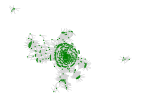

In [12]:
# get nodes and graph for initial USA flight network and plot
g1, nodes1 = generategraph(flight_freq, "Source_IATA", "Dest_IATA", "directed")
println("The number of edges in network is ", ne(g1))
println("The number of nodes in network is ", nv(g1))
printstyled("\n\t\t\tDirected Weighted Graph"; color=:bold)
gplot(g1, nodefillc = "green", linetype="curve", EDGELINEWIDTH = 0.5) # plot default spring layout

### 1.2 Directed, weighted network - filter by edge weights

<font size="2"> *Since the initial network has high number of nodes & edges, this interactive slider can be used to filter the graph by edge weights/flight frequency to provide a better view of the network <br><br>
By default, the graph shows the network with edge weights greater than equal to 10, which means it shows the aiports between which the number of flights is greater than or equal to 10. We can see from the graph that there are **20** flights from **ORD->ATL** and **19** flights from **ATL->ORD** which are the highest values in the network.*

In [13]:
printstyled("\n\t\t\t\t\t\tDirected Weighted Graph"; color=:bold)
@manipulate for frequency = slider(1:1:20, show_value=true, label = "Number of flights")
    filter_flights = sort(flight_freq[(flight_freq.count .>= frequency[]), :]) # filter df by flight frequency chosen
    g2, nodes2 = generategraph(filter_flights, "Source_IATA", "Dest_IATA", "directed") 
    weights2 = weight.(edges(g2))
    gplot(g2, nodefillc = "green", edgelabel = weights2, nodelabel = nodes2) # plot default spring layout
end


						Directed Weighted Graph

Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Scope(Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :label), Any["Number of flights"], Dict{Symbol, Any}(:className => "interact ", :style => Dict{Any, Any}(:padding => "5px 10px 0px 10px")))], Dict{Symbol, Any}(:className => "interact-flex-row-left")), Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :input), Any[], Dict{Symbol, Any}(:max => 20, :min => 1, :attributes => Dict{Any, Any}(:type => "range", Symbol("data-bind") => "numericValue: index, valueUpdate: 'input', event: {change: function (){this.changes(this.changes()+1)}}", "orient" => "horizontal"), :step => 1, :show_value => true, :className => "slider slider is-fullwidth", :style => Dict{Any, Any}()))], Dict{Symbol, Any}(:className => "interact-flex-row-center")), Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :p), Any[], Dict{Symbol, Any}(:attributes => Dict("data-bind" => "text: formatted_val")))], Dict{Symbol, Any}(:className => "interact-flex-row-right"))], Dict{Symbol, Any}(:className => "interact-flex-row interact-widget")), Dict{String, Tuple{Observables.AbstractObservable, Union{Nothing, Bool}}}("changes" => (Observable{Int64} with 1 listeners. Value:
0, nothing), "index" => (Observable{Any} with 2 listeners. Value:
10, nothing)), Set{String}(), nothing, Asset[Asset("js", "knockout", "C:\\Users\\divya\\.julia\\packages\\Knockout\\3gjS1\\src\\..\\assets\\knockout.js"), Asset("js", "knockout_punches", "C:\\Users\\divya\\.julia\\packages\\Knockout\\3gjS1\\src\\..\\assets\\knockout_punches.js"), Asset("js", nothing, "C:\\Users\\divya\\.julia\\packages\\InteractBase\\o1I6G\\src\\..\\assets\\all.js"), Asset("css", nothing, "C:\\Users\\divya\\.julia\\packages\\InteractBase\\o1I6G\\src\\..\\assets\\style.css"), Asset("css", nothing, "C:\\Users\\divya\\.julia\\packages\\Interact\\pVyN2\\src\\..\\assets\\bulma_confined.min.css")], Dict{Any, Any}("changes" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"changes\"]()) ? (this.valueFromJulia[\"changes\"]=true, this.model[\"changes\"](val)) : undefined})")], "index" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"index\"]()) ? (this.valueFromJulia[\"index\"]=true, this.model[\"index\"](val)) : undefined})")]), WebIO.ConnectionPool(Channel{Any}(32), Set{AbstractConnection}(), Condition(Base.InvasiveLinkedList{Task}(Task (runnable) @0x0000000082f21f50, Task (runnable) @0x0000000082f21f50), Base.AlwaysLockedST(1))), WebIO.JSString[WebIO.JSString("function () {\n    var handler = (function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init: function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            });\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            });\n            ko.applyBindingsToNode(\n                element,\n                {\n                    value: stringified,\n                    valueUpdate: allBindings.get('valueUpdate'),\n                },\n                context,\n            );\n        }\n    };\n    var json_data = {\"formatted_vals\":[\"1\",\"2\",\"3\",\"4\",\"5\",\"6\",\"7\",\"8\",\"9\",\"10\",\"11\",\"12\",\"13\",\"14\",\"15\",\"16\",\"17\",\"18\",\"19\",\"20\"],\"changes\":WebIO.getval({\"name\":\"changes\",\

### 1.3 USA Flights Network (Identify major airports)

<font size="2"> *In this section, airports in the network with high values for outdegree and betweenness centrality are identified*

### 1.3a Graph with node size based on outdegree

<font size="2"> *Graph has been plotted by assigning nodesize and color based on outdegree value. Nodes(Airports) in the network with high outdegree values are identified*


		Nodes color/size by Outdegree

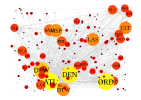

In [14]:
# Use all airports and routes graph 
# assign node size based on outdegree
nodesize3 = [outdegree(g1, v) for v in Graphs.vertices(g1)]

# assign color based on node size
size3 = nodesize3/maximum(nodesize3)
nodefillc3 = [RGB(i*5,i^2,i/10) for i in size3]

printstyled("\n\t\tNodes color/size by Outdegree"; color=:bold)

# plot on random layout
gplot(g1, layout = random_layout, nodefillc = nodefillc3, NODESIZE = nodesize3/1000,  nodelabel = nodes1,
        NODELABELSIZE = nodesize3/20, EDGELINEWIDTH = weight.(edges(g1))/50)

**Airports with high outdegree values in graph:** <br>
ATL <br>
ORD <br>
DEN <br>
DFW <br>
MSP <br>

In [15]:
# nodes with outdegree > 100 (airports that has over 100 destinations)
high_outdegree = findall(item -> item > 100, nodesize3)

printstyled("Airports with outdegree > 100\n\n"; color=:bold)
printstyled("Airport_IATA    Outdegree   Airport_Name\n", color = :bold)
for i in high_outdegree
    airport_name = reduce(vcat,[airports_usa[(airports_usa.IATA .== nodes1[i]) ,:].Name ])
    println("   ", nodes1[i],"\t\t  ", nodesize3[i] ,"       ", airport_name[])
end

Airports with outdegree > 100

Airport_IATA    Outdegree   Airport_Name
   ATL		  153       Hartsfield Jackson Atlanta International Airport
   CLT		  110       Charlotte Douglas International Airport
   DEN		  148       Denver International Airport
   DFW		  138       Dallas Fort Worth International Airport
   DTW		  114       Detroit Metropolitan Wayne County Airport
   IAH		  101       George Bush Intercontinental Houston Airport
   LAS		  113       McCarran International Airport
   MSP		  116       Minneapolis-St Paul International/Wold-Chamberlain Airport
   ORD		  149       Chicago O'Hare International Airport


### 1.3b Graph with node size based on betweenness centrality

<font size="2"> *Graph has been plotted by assigning nodesize and color based on betweenness centrality value. Nodes(Airports) in the network with high betweenness centrality values are identified*


		Nodes color/size by betweenness centrality

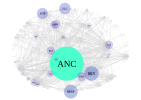

In [16]:
# Use the all airports and routes graph 
# assign node size based on betweenness centrality
nodesize4 =  betweenness_centrality(g1)

# assign color based on node size
size4 = nodesize4/maximum(nodesize4)
nodefillc4 = nodefillc = [RGBA(0.3,i,0.8,i) for i in size4] #[RGB(0.5,i^2,i/10) for i in size4]

# define 3 shells for shell layout
nlist = Vector{Vector{Int}}(undef, 3) 
nlist[1] = 1:100 # first shell
nlist[2] = 101:300 # second shell
nlist[3] = 301:nv(g1) # third shell
locs_x, locs_y = shell_layout(g1, nlist)

printstyled("\n\t\tNodes color/size by betweenness centrality"; color=:bold)

# plot on shell layout
gplot(g1, locs_x, locs_y, nodefillc = nodefillc4, NODESIZE = nodesize4,  nodelabel = nodes1,
        NODELABELSIZE = nodesize4*30, EDGELINEWIDTH = weight.(edges(g1))/50)

**Airports with high betweenness centrality in graph:** <br>
ANC <br>
DEN <br>
MSP <br>
SLC <br>
SEA <br>

In [17]:
# nodes with high betweenness centrality (centrality measure based on shortest paths)
high_bet = findall(item -> item > 0.08, nodesize4)

printstyled("Airports with betweenness centrality > 0.08\n\n"; color=:bold)
printstyled("Airport_IATA   betweenness\t Airport_Name\n", color = :bold)
for i in high_bet
    airport_name = reduce(vcat,[airports_usa[(airports_usa.IATA .== nodes1[i]) ,:].Name ])
    println("   ", nodes1[i],"\t       ", floor.(nodesize4[i], digits = 10), "      ", airport_name[])
end

Airports with betweenness centrality > 0.08

Airport_IATA   betweenness	 Airport_Name
   ANC	       0.3015639047      Ted Stevens Anchorage International Airport
   DEN	       0.1279072637      Denver International Airport
   MSP	       0.1219985682      Minneapolis-St Paul International/Wold-Chamberlain Airport
   SEA	       0.0973650239      Seattle Tacoma International Airport
   SLC	       0.1016200246      Salt Lake City International Airport


## <span style = 'color:indigo'> Part 2. USA Flights Network (SimpleWeightedGraph)
    
<font size="2"> *In this section, an undirected weighted network is created. In order to do this, flights between same airports are combined. For example, the flight_freq dataframe will have two rows for flights between ATL & ORD airports (one for ATL->ORD and another for ORD->ATL). We will combine these two rows and add their weights to create undirected weighted flight network.*

In [18]:
# create a new dataframe to combine flights between same airports ( a->b  & b->a)
flights_undirected = DataFrame(Airport1 = String[], Airport2 = String[], count = Int64[])

for row in eachrow(flight_freq)
    src, dest, cnt = row.Source_IATA, row.Dest_IATA, row.count 
    df_flights = flight_freq[(flight_freq.Source_IATA .== dest) .& (flight_freq.Dest_IATA .== src), :]
    df_length = nrow(df_flights)
    
    if df_length == 1
        if isempty(flights_undirected[(flights_undirected.Airport2 .== src) .& (flights_undirected.Airport1 .== dest), :])
            push!(flights_undirected, [src  dest cnt + df_flights.count[]])
        end
    elseif df_length == 0
        push!(flights_undirected, [src  dest cnt])           
    end
end

sort!(flights_undirected, [:Airport1, :Airport2])

,Airport1,Airport2,count
,String,String,Int64
1,ABE,ATL,6
2,ABE,CLT,4
3,ABE,DTW,2
4,ABE,MYR,2
5,ABE,ORD,2
⋮,⋮,⋮,⋮


### 2.1 Complete undirected, weighted network  (All flights & routes)
<font size="2"> *This flight network graph is an undirected weighted graph which has all USA airports (549 nodes) and routes(2787 weighted edges). Since the routes are combined between same airports, the number of edges is reduced here as compared to directed graph in part 1.1*

The number of edges in network is 2787
The number of nodes in network is 549

			Undirected Weighted Graph

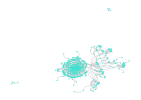

In [19]:
# get nodes and graph for USA flight undirected network and plot
g5, nodes5 = generategraph(flights_undirected, "Airport1", "Airport2", "undirected")
println("The number of edges in network is ", ne(g5))
println("The number of nodes in network is ", nv(g5))
printstyled("\n\t\t\tUndirected Weighted Graph"; color=:bold)
gplot(g5, linetype="curve", EDGELINEWIDTH = 0.5)

### 2.2 Undirected, weighted network - filter by edge weights

<font size="2"> *Interactive slider can be used to filter the graph by edge weights/flight frequency. <br><br>
By default, the graph shows the network with edge weights greater than equal to 20, which means it shows the aiports between which the number of flights is greater than or equal to 20. We can see from the graph that there are **39** flights between **ORD and ATL** airports which is the highest value in the network.*

In [20]:
printstyled("\n\t\t\t\t\t\tUndirected Weighted Graph"; color=:bold)

@manipulate for frequency = slider(1:1:39, show_value=true, label = "Number of flights")
    filter_flights_undir = sort(flights_undirected[(flights_undirected.count .>= frequency[]), :])
    g6, nodes6 = generategraph(filter_flights_undir, "Airport1", "Airport2", "undirected")
    weights6 = weight.(edges(g6))
    gplot(g6, edgelabel = weights6, linetype="curve", nodelabel = nodes6) 
end


						Undirected Weighted Graph

Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Scope(Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :label), Any["Number of flights"], Dict{Symbol, Any}(:className => "interact ", :style => Dict{Any, Any}(:padding => "5px 10px 0px 10px")))], Dict{Symbol, Any}(:className => "interact-flex-row-left")), Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :input), Any[], Dict{Symbol, Any}(:max => 39, :min => 1, :attributes => Dict{Any, Any}(:type => "range", Symbol("data-bind") => "numericValue: index, valueUpdate: 'input', event: {change: function (){this.changes(this.changes()+1)}}", "orient" => "horizontal"), :step => 1, :show_value => true, :className => "slider slider is-fullwidth", :style => Dict{Any, Any}()))], Dict{Symbol, Any}(:className => "interact-flex-row-center")), Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :p), Any[], Dict{Symbol, Any}(:attributes => Dict("data-bind" => "text: formatted_val")))], Dict{Symbol, Any}(:className => "interact-flex-row-right"))], Dict{Symbol, Any}(:className => "interact-flex-row interact-widget")), Dict{String, Tuple{Observables.AbstractObservable, Union{Nothing, Bool}}}("changes" => (Observable{Int64} with 1 listeners. Value:
0, nothing), "index" => (Observable{Any} with 2 listeners. Value:
20, nothing)), Set{String}(), nothing, Asset[Asset("js", "knockout", "C:\\Users\\divya\\.julia\\packages\\Knockout\\3gjS1\\src\\..\\assets\\knockout.js"), Asset("js", "knockout_punches", "C:\\Users\\divya\\.julia\\packages\\Knockout\\3gjS1\\src\\..\\assets\\knockout_punches.js"), Asset("js", nothing, "C:\\Users\\divya\\.julia\\packages\\InteractBase\\o1I6G\\src\\..\\assets\\all.js"), Asset("css", nothing, "C:\\Users\\divya\\.julia\\packages\\InteractBase\\o1I6G\\src\\..\\assets\\style.css"), Asset("css", nothing, "C:\\Users\\divya\\.julia\\packages\\Interact\\pVyN2\\src\\..\\assets\\bulma_confined.min.css")], Dict{Any, Any}("changes" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"changes\"]()) ? (this.valueFromJulia[\"changes\"]=true, this.model[\"changes\"](val)) : undefined})")], "index" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"index\"]()) ? (this.valueFromJulia[\"index\"]=true, this.model[\"index\"](val)) : undefined})")]), WebIO.ConnectionPool(Channel{Any}(32), Set{AbstractConnection}(), Condition(Base.InvasiveLinkedList{Task}(Task (runnable) @0x000000000f0bb850, Task (runnable) @0x000000000f0bb850), Base.AlwaysLockedST(1))), WebIO.JSString[WebIO.JSString("function () {\n    var handler = (function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init: function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            });\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            });\n            ko.applyBindingsToNode(\n                element,\n                {\n                    value: stringified,\n                    valueUpdate: allBindings.get('valueUpdate'),\n                },\n                context,\n            );\n        }\n    };\n    var json_data = {\"formatted_vals\":[\"1\",\"2\",\"3\",\"4\",\"5\",\"6\",\"7\",\"8\",\"9\",\"10\",\"11\",\"12\",\"13\",\"14\",\"15\",\"16\",\"17\",\"18\",\"19\",\"20\",\"21\",\"22\",\"23\",\"24\",\"25\",\"26\",\"27\",

## <span style = 'color:indigo'> Part 3. USA Flights Network (Map view)
    
<font size="2"> *In this section, a map visualization of the USA flights network has been created. The views are interactive and the network can be viewed based on the selected airport or airline*

### 3.1. Flight Network by Source Airport

In [21]:
# import US map JSON dataset
us10m = dataset("us-10m")

Vega JSON Dataset

In [22]:
# function to create a map view of flight network
function airportmap(airport_view)
    # plot size
    @vlplot(width = 800, height = 500) +
    
    # base map
    @vlplot(
        mark={
            :geoshape,
            fill=:white,
            stroke=:black
        },
        title = "Network by Source Airport - " * airports_usa[(airports_usa.IATA .== airport_view),:].Name[] ,
        data={
            values=us10m,
            format={
                type=:topojson,
                feature=:states
            }
        },
        projection={type=:albersUsa}) +
    
      # line marker connecting source and destination airports
    @vlplot(
        :rule,
        data=routes_usa,
        transform=[
            {filter={field=:Source_IATA,equal=airport_view}},
            {
                lookup=:Source_IATA,
                from={
                    data=airports_usa,
                    key=:IATA,
                    fields=["latitude", "longitude"]
                },
                as=["origin_latitude", "origin_longitude"]
            },
            {
                lookup=:Dest_IATA,
                from={
                    data=airports_usa,
                    key=:IATA,
                    fields=["latitude", "longitude"]
                },
                as=["dest_latitude", "dest_longitude"]
            }
        ],
        projection={type=:albersUsa},
        longitude="origin_longitude:q",
        latitude="origin_latitude:q",
        longitude2="dest_longitude:q",
        latitude2="dest_latitude:q",
        color={value=:lightblue}) +
    
    # point marker for destination aiports 
    @vlplot(
        data = routes_usa,
        mark = :point,
        transform=[
            {filter={field=:Source_IATA,equal=airport_view}},
            {
                lookup=:Source_IATA,
                from={
                    data=airports_usa,
                    key=:IATA,
                    fields=["latitude", "longitude"]
                }}],

        projection = {type=:albersUsa},
        longitude = "longitude:q",
        latitude="latitude:q",
        size={value=30},
        color={value=:green}) +
    
     # point marker for source aiport
    @vlplot(
        data = routes_usa,
        mark = :point,
        transform=[
            {filter={field=:Source_IATA,equal=airport_view}},
            {
                lookup=:Dest_IATA,
                from={
                    data=airports_usa,
                    key=:IATA,
                    fields=["latitude", "longitude"]
                }}],

        projection = {type=:albersUsa},
        longitude = "longitude:q",
        latitude="latitude:q",
        size={value=10},
        color={value=:red}) +
    
    # text marker for displaying destination aiport name
    @vlplot(
        data = routes_usa,
        mark={
            type=:text,
            dy=-10
        },
        transform=[
            {filter={field=:Source_IATA,equal=airport_view}},
            {
                lookup=:Dest_IATA,
                from={
                    data=airports_usa,
                    key=:IATA,
                    fields=["latitude", "IATA", "longitude"]
                }}],

        projection = {type=:albersUsa},
        longitude = "longitude:q",
        latitude= "latitude:q",
        size= {value=10},
        color= {value=:black},
        text = "IATA:n") +
    
     # text marker for displaying source aiport name
    @vlplot(
        data = routes_usa,
        mark={
            type=:text,
            dy=-10
        },
        transform=[
            {filter={field=:Source_IATA,equal=airport_view}},
            {
                lookup=:Source_IATA,
                from={
                    data=airports_usa,
                    key=:IATA,
                    fields=["latitude", "IATA", "longitude"]
                }}],

        projection = {type=:albersUsa},
        longitude = "longitude:q",
        latitude= "latitude:q",
        size= {value=10},
        color= {value=:black},
        text = "IATA:n") 
end

airportmap (generic function with 1 method)

<font size="2"> *An interative dropdown has been created to view the USA flight network based on source airport selected. By default, the airport chosen is "DFW" (Dallas fort worth international airport). We can see that there are direct connecting flights from DFW to many other aiports specifically it is more in the east as compared to west. There are also some states in the northwest that has either no connectivity or very less connected aiports.*

<font size="2"> **Note:** Please wait for few seconds for the map to refresh after selecting the source airport from the dropdown

In [23]:
# dropdown widget (choose airport from dropdown to view network for different airport)
node_selected = dropdown(nodes1, show_value=true, label = "Select Source Airport", value = "DFW")
@manipulate for src_airport = node_selected
    airportmap(src_airport)  
end

Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Scope(Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any["Select Source Airport", Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :select), Any[], Dict{Symbol, Any}(:attributes => Dict{Union{String, Symbol}, Any}(Symbol("data-bind") => "options : options_js, value : index, optionsText: 'key', optionsValue: 'val', valueAllowUnset: true, optionsAfterRender: disablePlaceholder"), :show_value => true))], Dict{Symbol, Any}(:className => "select "))], Dict{Symbol, Any}(:style => Dict("display" => "flex", "flex-direction" => "column"))), Dict{String, Tuple{Observables.AbstractObservable, Union{Nothing, Bool}}}("options_js" => (Observable{Vector{OrderedDict}} with 1 listeners. Value:
OrderedDict[OrderedDict{String, Any}("key" => "ABE", "val" => 1, "id" => "idacoLMvld"), OrderedDict{String, Any}("key" => "ABI", "val" => 2, "id" => "idcOTADKwW"), OrderedDict{String, Any}("key" => "ABL", "val" => 3, "id" => "id6qQfMdvb"), OrderedDict{String, Any}("key" => "ABQ", "val" => 4, "id" => "idDymRfapZ"), OrderedDict{String, Any}("key" => "ABR", "val" => 5, "id" => "idQVLRvD7b"), OrderedDict{String, Any}("key" => "ABY", "val" => 6, "id" => "idGk7ZxFb5"), OrderedDict{String, Any}("key" => "ACK", "val" => 7, "id" => "idyCImAjdp"), OrderedDict{String, Any}("key" => "ACT", "val" => 8, "id" => "idgpS8kJad"), OrderedDict{String, Any}("key" => "ACV", "val" => 9, "id" => "idfrXTvGwO"), OrderedDict{String, Any}("key" => "ACY", "val" => 10, "id" => "idCzQPvDLu")  …  OrderedDict{String, Any}("key" => "WNA", "val" => 540, "id" => "idcHycX3Xt"), OrderedDict{String, Any}("key" => "WRG", "val" => 541, "id" => "idc2uyxxHr"), OrderedDict{String, Any}("key" => "WRL", "val" => 542, "id" => "idiEARjZ16"), OrderedDict{String, Any}("key" => "WSN", "val" => 543, "id" => "idWVqTkmdu"), OrderedDict{String, Any}("key" => "WTK", "val" => 544, "id" => "idPdskm4VL"), OrderedDict{String, Any}("key" => "XNA", "val" => 545, "id" => "idxPj82MlG"), OrderedDict{String, Any}("key" => "YAK", "val" => 546, "id" => "id6jCdlVM6"), OrderedDict{String, Any}("key" => "YKM", "val" => 547, "id" => "idqMEDx5hM"), OrderedDict{String, Any}("key" => "YNG", "val" => 548, "id" => "idTbkeVWqt"), OrderedDict{String, Any}("key" => "YUM", "val" => 549, "id" => "idDHtylBZn")], nothing), "index" => (Observable{Any} with 2 listeners. Value:
134, nothing)), Set{String}(), nothing, Asset[Asset("js", "knockout", "C:\\Users\\divya\\.julia\\packages\\Knockout\\3gjS1\\src\\..\\assets\\knockout.js"), Asset("js", "knockout_punches", "C:\\Users\\divya\\.julia\\packages\\Knockout\\3gjS1\\src\\..\\assets\\knockout_punches.js"), Asset("js", nothing, "C:\\Users\\divya\\.julia\\packages\\InteractBase\\o1I6G\\src\\..\\assets\\all.js"), Asset("css", nothing, "C:\\Users\\divya\\.julia\\packages\\InteractBase\\o1I6G\\src\\..\\assets\\style.css"), Asset("css", nothing, "C:\\Users\\divya\\.julia\\packages\\Interact\\pVyN2\\src\\..\\assets\\bulma_confined.min.css")], Dict{Any, Any}("options_js" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"options_js\"]()) ? (this.valueFromJulia[\"options_js\"]=true, this.model[\"options_js\"](val)) : undefined})")], "index" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"index\"]()) ? (this.valueFromJulia[\"index\"]=true, this.model[\"index\"](val)) : undefined})")]), WebIO.ConnectionPool(Channel{Any}(32), Set{AbstractConnection}(), Condition(Base.InvasiveLinkedList{Task}(Task (runnable) @0x0000000087f652d0, Task (runnable) @0x0000000087f652d0), Base.AlwaysLockedST(1))), WebIO.JSString[WebIO.JSString("function () {\n    var handler = (function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init: function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n              

In [24]:
global_clustering_coefficient(g1)

0.07757585522633605

### 3.2. Flight Network by Airlines

In [25]:
# function to create a map view of flight network
function airlinemap(airline_view, airline_name)
    # plot size
    @vlplot(width = 800, height = 500) +
    
    # base map
    @vlplot(
        mark={
            :geoshape,
            fill=:white,
            stroke=:black
        },
        title = "Network by Airlines - " * airline_name ,
        data={
            values=us10m,
            format={
                type=:topojson,
                feature=:states
            }
        },
        projection={type=:albersUsa}) +
    
    # point marker for aiports 
    @vlplot(
        data = routes_usa,
        mark = :point,
        transform=[
            {filter={field=:Airline_IATA,equal=airline_view}},
            {
                lookup=:Dest_IATA,
                from={
                    data=airports_usa,
                    key=:IATA,
                    fields=["latitude", "longitude"]
                }}],

        projection = {type=:albersUsa},
        longitude = "longitude:q",
        latitude="latitude:q",
        size={value=10},
        color={value=:red}) +
    
    # text marker for displaying destination aiport name
    @vlplot(
        data = routes_usa,
        mark={
            type=:text,
            dy=-10
        },
        transform=[
            {filter={field=:Airline_IATA,equal=airline_view}},
            {
                lookup=:Dest_IATA,
                from={
                    data=airports_usa,
                    key=:IATA,
                    fields=["latitude", "IATA", "longitude"]
                }}],

        projection = {type=:albersUsa},
        longitude = "longitude:q",
        latitude= "latitude:q",
        size= {value=10},
        color= {value=:black},
        text = "IATA:n") +
    
    # line marker connecting source and destination airports
    @vlplot(
        :rule,
        data=routes_usa,
        transform=[
            {filter={field=:Airline_IATA,equal=airline_view}},
            {
                lookup=:Source_IATA,
                from={
                    data=airports_usa,
                    key=:IATA,
                    fields=["latitude", "longitude"]
                },
                as=["origin_latitude", "origin_longitude"]
            },
            {
                lookup=:Dest_IATA,
                from={
                    data=airports_usa,
                    key=:IATA,
                    fields=["latitude", "longitude"]
                },
                as=["dest_latitude", "dest_longitude"]
            }
        ],
        projection={type=:albersUsa},
        longitude="origin_longitude:q",
        latitude="origin_latitude:q",
        longitude2="dest_longitude:q",
        latitude2="dest_latitude:q",
        color={value=:lightblue})
    
end

airlinemap (generic function with 1 method)

In [26]:
# list of airlines having flights
airlines_list = unique(routes_usa[!, "Airline_IATA"];)

# dict to get airlines name
airlines_dict = Dict()
for i in airlines_list
    airlines_name = airlines_df[(airlines_df.IATA .== i), :].Name
    if isempty(airlines_name)  
        airlines_dict[i] = i # K3 airlines - no airline map, display airline IATA
    elseif length(airlines_name) == 1
        airlines_dict[i] = airlines_name[] # DL, AA - unique name
    elseif length(airlines_name) > 1
        airlines_dict[i] = airlines_df[(airlines_df.IATA .== i), :].Name[1] # K5 - more than one name, display first
    end  
end

<font size="2"> *An interative dropdown has been created to view the USA flight network based on Airline selection. By default, the airlines chosen is "DL" (Delta airlines). We can see that there are direct connecting flights between many airports. We can also see that certain airports appear to be hubs for delta airlines like ATL, MSP, SLC, JFK, etc.*

<font size="2">  **Note:** Please wait for few seconds for the map to refresh after selecting airline from the dropdown

In [27]:
# interactive dropdown (choose airport from dropdown to view network for different ariline)
airline_selected = dropdown(airlines_list, show_value=true, label = "Select Airlines", value = "DL")
@manipulate for al = airline_selected
    airline_name = airlines_dict[al]
    airlinemap(al, airline_name)  
end

Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Scope(Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any["Select Airlines", Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :select), Any[], Dict{Symbol, Any}(:attributes => Dict{Union{String, Symbol}, Any}(Symbol("data-bind") => "options : options_js, value : index, optionsText: 'key', optionsValue: 'val', valueAllowUnset: true, optionsAfterRender: disablePlaceholder"), :show_value => true))], Dict{Symbol, Any}(:className => "select "))], Dict{Symbol, Any}(:style => Dict("display" => "flex", "flex-direction" => "column"))), Dict{String, Tuple{Observables.AbstractObservable, Union{Nothing, Bool}}}("options_js" => (Observable{Vector{OrderedDict}} with 1 listeners. Value:
OrderedDict[OrderedDict{String, Any}("key" => "2O", "val" => 1, "id" => "idm8L0C1Vv"), OrderedDict{String, Any}("key" => "3E", "val" => 2, "id" => "id8jTJchez"), OrderedDict{String, Any}("key" => "3F", "val" => 3, "id" => "idl3gU3Eg5"), OrderedDict{String, Any}("key" => "3M", "val" => 4, "id" => "idFesNefrN"), OrderedDict{String, Any}("key" => "4B", "val" => 5, "id" => "idjsjPX0T7"), OrderedDict{String, Any}("key" => "4E", "val" => 6, "id" => "idG7UV0FWX"), OrderedDict{String, Any}("key" => "4W", "val" => 7, "id" => "idCYXRItsk"), OrderedDict{String, Any}("key" => "4Y", "val" => 8, "id" => "idyVqTXfKi"), OrderedDict{String, Any}("key" => "7H", "val" => 9, "id" => "idx64lVN52"), OrderedDict{String, Any}("key" => "7S", "val" => 10, "id" => "idzkpITWpf")  …  OrderedDict{String, Any}("key" => "VA", "val" => 67, "id" => "idABlACwDW"), OrderedDict{String, Any}("key" => "VS", "val" => 68, "id" => "idIezYZOdW"), OrderedDict{String, Any}("key" => "VX", "val" => 69, "id" => "idnt3pDsg6"), OrderedDict{String, Any}("key" => "WN", "val" => 70, "id" => "idkFRjyCGF"), OrderedDict{String, Any}("key" => "WP", "val" => 71, "id" => "id74r4YaZm"), OrderedDict{String, Any}("key" => "WS", "val" => 72, "id" => "idMmY1nVRU"), OrderedDict{String, Any}("key" => "X7", "val" => 73, "id" => "idEy2Vo9ms"), OrderedDict{String, Any}("key" => "YR", "val" => 74, "id" => "idz7QOuCmM"), OrderedDict{String, Any}("key" => "Z3", "val" => 75, "id" => "idrhx94AnZ"), OrderedDict{String, Any}("key" => "ZK", "val" => 76, "id" => "id9zoKYYve")], nothing), "index" => (Observable{Any} with 2 listeners. Value:
28, nothing)), Set{String}(), nothing, Asset[Asset("js", "knockout", "C:\\Users\\divya\\.julia\\packages\\Knockout\\3gjS1\\src\\..\\assets\\knockout.js"), Asset("js", "knockout_punches", "C:\\Users\\divya\\.julia\\packages\\Knockout\\3gjS1\\src\\..\\assets\\knockout_punches.js"), Asset("js", nothing, "C:\\Users\\divya\\.julia\\packages\\InteractBase\\o1I6G\\src\\..\\assets\\all.js"), Asset("css", nothing, "C:\\Users\\divya\\.julia\\packages\\InteractBase\\o1I6G\\src\\..\\assets\\style.css"), Asset("css", nothing, "C:\\Users\\divya\\.julia\\packages\\Interact\\pVyN2\\src\\..\\assets\\bulma_confined.min.css")], Dict{Any, Any}("options_js" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"options_js\"]()) ? (this.valueFromJulia[\"options_js\"]=true, this.model[\"options_js\"](val)) : undefined})")], "index" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"index\"]()) ? (this.valueFromJulia[\"index\"]=true, this.model[\"index\"](val)) : undefined})")]), WebIO.ConnectionPool(Channel{Any}(32), Set{AbstractConnection}(), Condition(Base.InvasiveLinkedList{Task}(Task (runnable) @0x000000008e138010, Task (runnable) @0x000000008e138010), Base.AlwaysLockedST(1))), WebIO.JSString[WebIO.JSString("function () {\n    var handler = (function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init: function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n     

## <span style = 'color:indigo'> Part 4. Shortest path (select source and destination)
<font size="2"> *In this section, shortest path between two airports can be identified by choosing a source and destination airport from the respective dropdowns. If there is a direct connecting flight, source and destination airports chosen will be displayed. If not, the airports through which source and destination can be connected by shortest distance calculated using dijkstra algorithm will be displayed.*

In [28]:
# Update weights to one to find shortest path
flights_airports = DataFrame(routes_usa |> @groupby({_.Source_IATA, _.Dest_IATA, _.Source_ID, _.Dest_ID}) |> @map({Source_IATA=key(_)[1], Dest_IATA=key(_)[2],Source_ID=key(_)[3], Dest_ID=key(_)[4],  
                  count=1}))

# create graph
g7, nodes7 = generategraph(flights_airports, "Source_IATA", "Dest_IATA", "undirected")

({549, 2787} undirected simple Int64 graph with Float64 weights, String3["ABE", "ABI", "ABL", "ABQ", "ABR", "ABY", "ACK", "ACT", "ACV", "ACY"  …  "WNA", "WRG", "WRL", "WSN", "WTK", "XNA", "YAK", "YKM", "YNG", "YUM"])

In [29]:
nodes_int = [x for x in 1:size(nodes7)[1]]
nodes_IATA_dict = Dict(zip(nodes7, nodes_int))

nodes_ids_dict = Dict(zip(nodes_int, nodes7))

src_selected = dropdown(nodes1, show_value=true, label = "Choose Source Airport", value = "JFK")
dst_selected = dropdown(nodes1, show_value=true, label = "Choose Destination Airport", value = "MSP")

@manipulate for src = src_selected, dst = dst_selected
    shortest_path = (enumerate_paths(dijkstra_shortest_paths(g7, nodes_IATA_dict[src]), nodes_IATA_dict[dst]))
    println("Shortest path between ",src_selected[], " and ", dst_selected[])
    for i in shortest_path
        print(nodes_ids_dict[i],"\t")
    end
    println("")
end

Shortest path between JFK and MSP
JFK	MSP	


Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Scope(Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any["Choose Source Airport", Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[Node{WebIO.DOM}(WebIO.DOM(:html, :select), Any[], Dict{Symbol, Any}(:attributes => Dict{Union{String, Symbol}, Any}(Symbol("data-bind") => "options : options_js, value : index, optionsText: 'key', optionsValue: 'val', valueAllowUnset: true, optionsAfterRender: disablePlaceholder"), :show_value => true))], Dict{Symbol, Any}(:className => "select "))], Dict{Symbol, Any}(:style => Dict("display" => "flex", "flex-direction" => "column"))), Dict{String, Tuple{Observables.AbstractObservable, Union{Nothing, Bool}}}("options_js" => (Observable{Vector{OrderedDict}} with 1 listeners. Value:
OrderedDict[OrderedDict{String, Any}("key" => "ABE", "val" => 1, "id" => "idfSafK5by"), OrderedDict{String, Any}("key" => "ABI", "val" => 2, "id" => "idawCMQ0gZ"), OrderedDict{String, Any}("key" => "ABL", "val" => 3, "id" => "id8wXBPD1J"), OrderedDict{String, Any}("key" => "ABQ", "val" => 4, "id" => "idXdH8XOH4"), OrderedDict{String, Any}("key" => "ABR", "val" => 5, "id" => "idkZhufuIV"), OrderedDict{String, Any}("key" => "ABY", "val" => 6, "id" => "id2a4TnIDk"), OrderedDict{String, Any}("key" => "ACK", "val" => 7, "id" => "idQSu7fbvC"), OrderedDict{String, Any}("key" => "ACT", "val" => 8, "id" => "idCu662kAb"), OrderedDict{String, Any}("key" => "ACV", "val" => 9, "id" => "idGauBWGrk"), OrderedDict{String, Any}("key" => "ACY", "val" => 10, "id" => "ideCmuKLS4")  …  OrderedDict{String, Any}("key" => "WNA", "val" => 540, "id" => "id2kSxyDb1"), OrderedDict{String, Any}("key" => "WRG", "val" => 541, "id" => "idP8trK3XP"), OrderedDict{String, Any}("key" => "WRL", "val" => 542, "id" => "idwfEyUolj"), OrderedDict{String, Any}("key" => "WSN", "val" => 543, "id" => "idca75V22U"), OrderedDict{String, Any}("key" => "WTK", "val" => 544, "id" => "idv57bINnQ"), OrderedDict{String, Any}("key" => "XNA", "val" => 545, "id" => "idgVSfG1Hx"), OrderedDict{String, Any}("key" => "YAK", "val" => 546, "id" => "idzBE7hJRM"), OrderedDict{String, Any}("key" => "YKM", "val" => 547, "id" => "id83N9JzI8"), OrderedDict{String, Any}("key" => "YNG", "val" => 548, "id" => "idM1exFdSU"), OrderedDict{String, Any}("key" => "YUM", "val" => 549, "id" => "idKuHlGQd3")], nothing), "index" => (Observable{Any} with 2 listeners. Value:
263, nothing)), Set{String}(), nothing, Asset[Asset("js", "knockout", "C:\\Users\\divya\\.julia\\packages\\Knockout\\3gjS1\\src\\..\\assets\\knockout.js"), Asset("js", "knockout_punches", "C:\\Users\\divya\\.julia\\packages\\Knockout\\3gjS1\\src\\..\\assets\\knockout_punches.js"), Asset("js", nothing, "C:\\Users\\divya\\.julia\\packages\\InteractBase\\o1I6G\\src\\..\\assets\\all.js"), Asset("css", nothing, "C:\\Users\\divya\\.julia\\packages\\InteractBase\\o1I6G\\src\\..\\assets\\style.css"), Asset("css", nothing, "C:\\Users\\divya\\.julia\\packages\\Interact\\pVyN2\\src\\..\\assets\\bulma_confined.min.css")], Dict{Any, Any}("options_js" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"options_js\"]()) ? (this.valueFromJulia[\"options_js\"]=true, this.model[\"options_js\"](val)) : undefined})")], "index" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"index\"]()) ? (this.valueFromJulia[\"index\"]=true, this.model[\"index\"](val)) : undefined})")]), WebIO.ConnectionPool(Channel{Any}(32), Set{AbstractConnection}(), Condition(Base.InvasiveLinkedList{Task}(Task (runnable) @0x000000000f763210, Task (runnable) @0x000000000f763210), Base.AlwaysLockedST(1))), WebIO.JSString[WebIO.JSString("function () {\n    var handler = (function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init: function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n              

Shortest path between ILI and MSP
ILI	ANC	MSP	
